# Data Visualization

**Author**: Benjamin Urben<br>
**Email**: burben@student.ethz.ch / benjamin.urben@hotmail.ch<br>
**Context**: Master Thesis on "Use of Machine Learning in the Design and Analysis for Steel Connections"<br>
**Institution**: ETH Zürich, Institute of Structural Engineering (IBK)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import os
import seaborn as sns
import pandas as pd

from sklearn.feature_selection import mutual_info_regression
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy import stats

from Settings import Directory, Plotting_Parameters
from DataReader import DataReader

import torch
from torch.utils.data import DataLoader, TensorDataset
from sklearn.inspection import permutation_importance
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import warnings
warnings.filterwarnings('ignore')

In [2]:
plot_params = Plotting_Parameters()
datareader = DataReader()

Root Directory set to:  c:\Users\benja\OneDrive\Desktop\Masterarbeit\Code\10_Neural_Networks
Extended_Database_filtered_converted.csv
extended_profiles_iterV2_1.csv
extended_profiles_iter_1.csv
GAL_Generated_Data.csv
Knee_Connection_Output_red.csv
Knee_parallel_I_Off0_Output_red_Q1.xlsx
Knee_parallel_I_Off0_Output_red_Q4.xlsx
Knee_parallel_I_Output_Q1.xlsx
Knee_parallel_I_Output_red_Q4.xlsx
Knee_perpendicular_n.stiff_Off0_Output_red_Q1.xlsx
Knee_perpendicular_n.stiff_Off0_Output_red_Q4.xlsx
Knee_perpendicular_n.stiff_Output_red_Q1.xlsx
Knee_perpendicular_n.stiff_Output_red_Q4.xlsx
Knee_widener_I_Output_Off0_red_Q1.xlsx
Knee_widener_I_Output_red_Q1.xlsx
_OLD


In [3]:
# Disable if plots should not be saved
plot_params.save_figures = True

In [4]:
df = datareader.load("Knee_Connection_Output_red.csv")

Knee_Connection_Output_red.csv: (714385, 53)


## Data Sets Availability

In [5]:
numeric_features = [column for column in df.columns if df[column].dtype in ['int64', 'float64']]

df_numeric = df[numeric_features]

In [5]:
df

,Profile_x,h_x,b_x,tw_x,tf_x,A_x,Av_x,Iy_x,Wely_x,Wply_x,...,M_Rd,V_Rd,V_contribution,M_contribution,V_norm,M_norm,target,Cat_h,Cat_t_stiffc,cost
0,HEA100,96,100,5.0,8.0,2123.610658,755.610658,3492000,72760.0,83010,...,7.641830,3.089307,0.076696,0.997054,0.030134,0.391741,0.392898,0,0,NaN
1,HEA100,96,100,5.0,8.0,2123.610658,755.610658,3492000,72760.0,83010,...,7.511201,6.579080,0.164399,0.986394,0.064174,0.385045,0.390356,0,0,NaN
2,HEA100,96,100,5.0,8.0,2123.610658,755.610658,3492000,72760.0,83010,...,6.858053,20.023286,0.485643,0.874157,0.195312,0.351563,0.402173,0,0,NaN
3,HEA100,96,100,5.0,8.0,2123.610658,755.610658,3492000,72760.0,83010,...,6.618565,26.087481,0.600000,0.800000,0.254464,0.339286,0.424107,0,0,NaN
4,HEA100,96,100,5.0,8.0,2123.610658,755.610658,3492000,72760.0,83010,...,6.286548,33.038422,0.707107,0.707107,0.322266,0.322266,0.455752,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
714380,HEB600,600,300,15.5,30.0,26995.778956,11080.778956,1710000000,5701000.0,6425000,...,0.000000,1021.848984,1.000000,0.000000,0.729880,0.000000,0.729880,1,1,372.156991
714381,HEB600,600,300,15.5,30.0,26995.778956,11080.778956,1710000000,5701000.0,6425000,...,830.346199,459.328547,0.495037,0.868872,0.328086,0.575846,0.662751,1,1,807.747298
714382,HEB600,600,300,15.5,30.0,26995.778956,11080.778956,1710000000,5701000.0,6425000,...,505.538281,671.164844,0.807179,0.590306,0.479395,0.350591,0.593914,1,1,807.747298
714383,HEB600,600,300,15.5,30.0,26995.778956,11080.778956,1710000000,5701000.0,6425000,...,406.537160,728.633805,0.879273,0.476318,0.520444,0.281934,0.591902,1,1,807.747298


## Target Visualization

In [6]:
df_reduced = df.sample(10_000)

In [7]:
df.columns

Index(['Profile_x', 'h_x', 'b_x', 'tw_x', 'tf_x', 'A_x', 'Av_x', 'Iy_x',
       'Wely_x', 'Wply_x', 'Steel grade_x', 'fy_x', 'tau_x', 'Vpl_x', 'Mpl_x',
       'Profile_y', 'h_y', 'b_y', 'tw_y', 'tf_y', 'A_y', 'Av_y', 'Iy_y',
       'Wely_y', 'Wply_y', 'Steel grade_y', 'fy_y', 'tau_y', 'Vpl_y', 'Mpl_y',
       'Gamma', 't_stiffc', 'h_wid', 'b_wid', 'd_wid', 't_fwid', 't_wwid',
       't_stiffb', 'Offset', 'Offset_Idea', 'M', 'V', 'proz', 'M_Rd', 'V_Rd',
       'V_contribution', 'M_contribution', 'V_norm', 'M_norm', 'target',
       'Cat_h', 'Cat_t_stiffc', 'cost'],
      dtype='object')

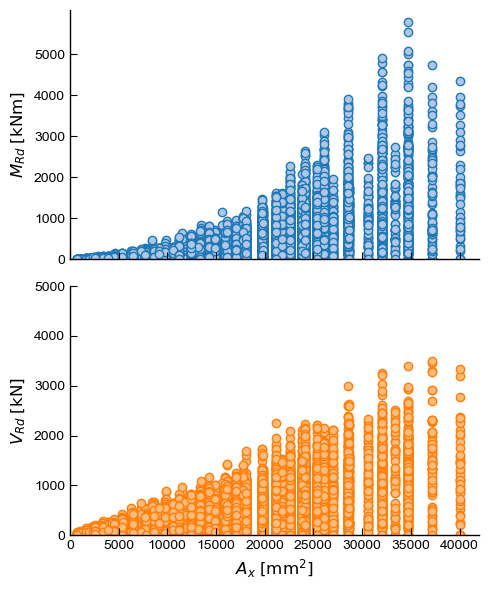

In [8]:
fig, axs = plt.subplots(2,1,figsize=(5,6), sharex=True)

axs[0].scatter(df_reduced['A_x'],df_reduced['M_Rd'],
            facecolor=plot_params.morecolors[1],
            edgecolor=plot_params.morecolors[0],)

axs[1].scatter(df_reduced['A_x'],df_reduced['V_Rd'],
            facecolor=plot_params.morecolors[3],
            edgecolor=plot_params.morecolors[2],)

axs[1].set_xlabel('$A_x$ $\mathrm{[mm^2]}$')
axs[0].set_ylabel('$M_{Rd}$ $\mathrm{[kNm]}$')
axs[1].set_ylabel('$V_{Rd}$ $\mathrm{[kN]}$')

for ax in axs:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlim([0,np.max(df_reduced['A_x'])*1.05])
    ax.set_ylim([0,None])
    ax.set_yticks(np.linspace(0, np.max(df_reduced['M_Rd'])//1000*1000,6))

plt.tight_layout()
plt.show()

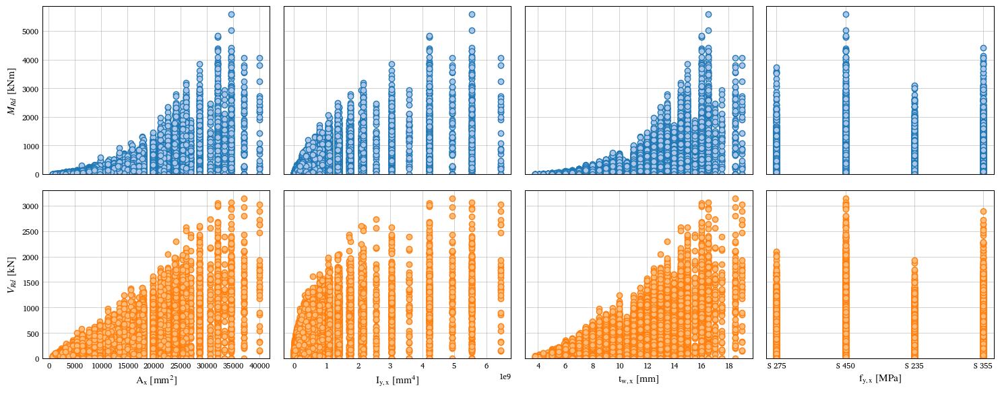

In [ ]:
fig, axs = plt.subplots(2,4,figsize=plot_params.get_figsize(1.0), sharex='col', sharey='row')

features_to_plot = ['A_x', 'Iy_x', 'tw_x', 'Steel grade_x']

for i, feature in enumerate(features_to_plot):
    axs[0,i].scatter(df_reduced[feature],df_reduced['M_Rd'],
                facecolor=plot_params.morecolors[1],
                edgecolor=plot_params.morecolors[0],
                zorder=2)

    axs[1,i].scatter(df_reduced[feature],df_reduced['V_Rd'],
                facecolor=plot_params.morecolors[3],
                edgecolor=plot_params.morecolors[2],
                zorder=2)
    
    axs[0,i].set_ylim([0,None])
    axs[1,i].set_ylim([0,None])

    axs[0,i].tick_params(axis='x', length=0)
    axs[1,i].tick_params(axis='x', length=0)
    axs[0,i].tick_params(axis='y', length=0)
    axs[1,i].tick_params(axis='y', length=0)

    axs[0,i].grid(visible=True, color='gray', alpha=0.5, linewidth=0.5, zorder=0)
    axs[1,i].grid(visible=True, color='gray', alpha=0.5, linewidth=0.5, zorder=0)

    axs[1,i].set_xlabel(plot_params.feature_labels[feature])

axs[1,0].set_ylabel('$V_{Rk}$ $\mathrm{[kN]}$')
axs[0,0].set_ylabel('$M_{Rk}$ $\mathrm{[kNm]}$')

plt.tight_layout()
plt.show()

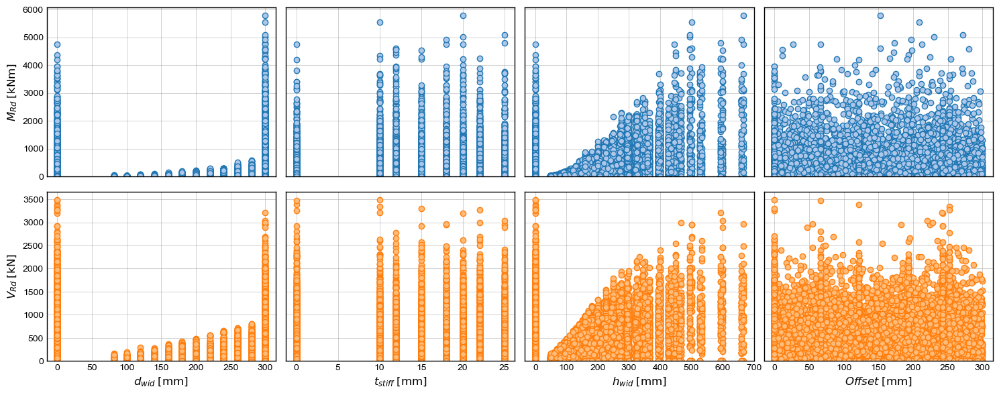

In [ ]:
fig, axs = plt.subplots(2,4,figsize=(15,6), sharex='col', sharey='row')

features_to_plot = ['d_wid', 't_stiffc', 'h_wid', 'Offset']

for i, feature in enumerate(features_to_plot):
    axs[0,i].scatter(df_reduced[feature],df_reduced['M_Rd'],
                facecolor=plot_params.morecolors[1],
                edgecolor=plot_params.morecolors[0],
                zorder=2)

    axs[1,i].scatter(df_reduced[feature],df_reduced['V_Rd'],
                facecolor=plot_params.morecolors[3],
                edgecolor=plot_params.morecolors[2],
                zorder=2)
    
    axs[0,i].set_ylim([0,None])
    axs[1,i].set_ylim([0,None])

    axs[0,i].tick_params(axis='x', length=0)
    axs[1,i].tick_params(axis='x', length=0)
    axs[0,i].tick_params(axis='y', length=0)
    axs[1,i].tick_params(axis='y', length=0)

    axs[0,i].grid(visible=True, color='gray', alpha=0.5, linewidth=0.5, zorder=0)
    axs[1,i].grid(visible=True, color='gray', alpha=0.5, linewidth=0.5, zorder=0)

    axs[1,i].set_xlabel(plot_params.feature_labels[feature])

axs[1,0].set_ylabel('$V_{Rd}$ $\mathrm{[kN]}$')
axs[0,0].set_ylabel('$M_{Rd}$ $\mathrm{[kNm]}$')

plt.tight_layout()
plt.show()

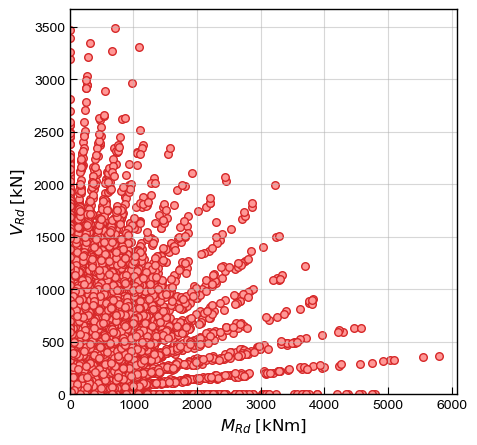

In [28]:
fig, ax = plt.subplots(figsize=(5, 5))

plt.scatter(df_reduced['M_Rd'],df_reduced['V_Rd'],
            facecolor=plot_params.morecolors[7],
            edgecolor=plot_params.morecolors[6],
            s=30.0)

plt.xlim([0,np.max(df_reduced['M_Rd'])*1.05])
plt.ylim([0,np.max(df_reduced['V_Rd'])*1.05])
plt.xlabel('$M_{Rd}$ $\mathrm{[kNm]}$')
plt.ylabel('$V_{Rd}$ $\mathrm{[kN]}$')
plt.grid(True, alpha=0.5)

plt.show()

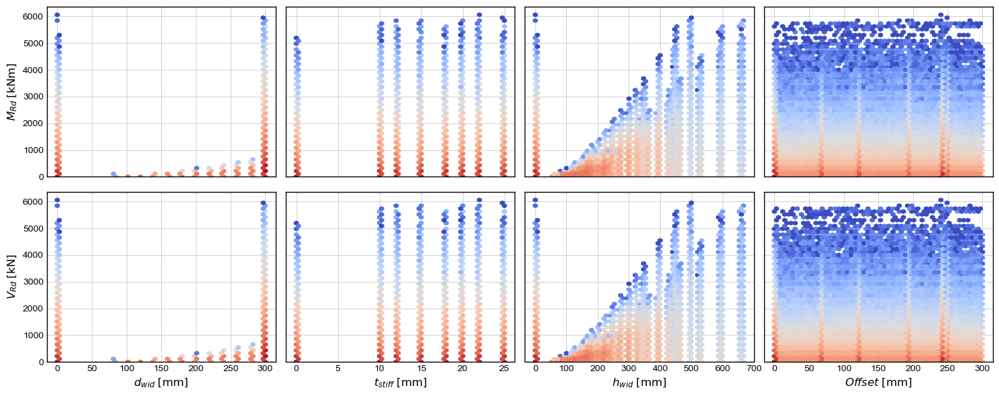

In [42]:
fig, axs = plt.subplots(2,4,figsize=(15,6), sharex='col', sharey='row')

features_to_plot = ['d_wid', 't_stiffc', 'h_wid', 'Offset']

for i, feature in enumerate(features_to_plot):    
    hbM = axs[0,i].hexbin(df[feature], df['M_Rd'], gridsize=50, cmap='coolwarm', 
            mincnt=1, norm=LogNorm(), zorder=2)
    
    hbV = axs[1,i].hexbin(df[feature], df['M_Rd'], gridsize=50, cmap='coolwarm', 
            mincnt=1, norm=LogNorm(), zorder=2)
    
    axs[0,i].set_ylim([0,None])
    axs[1,i].set_ylim([0,None])

    axs[0,i].tick_params(axis='x', length=0)
    axs[1,i].tick_params(axis='x', length=0)
    axs[0,i].tick_params(axis='y', length=0)
    axs[1,i].tick_params(axis='y', length=0)

    axs[0,i].grid(visible=True, color='gray', alpha=0.5, linewidth=0.5, zorder=0)
    axs[1,i].grid(visible=True, color='gray', alpha=0.5, linewidth=0.5, zorder=0)

    axs[1,i].set_xlabel(feature_labels[feature])

axs[1,0].set_ylabel('$V_{Rd}$ $\mathrm{[kN]}$')
axs[0,0].set_ylabel('$M_{Rd}$ $\mathrm{[kNm]}$')

plt.tight_layout()
plt.show()

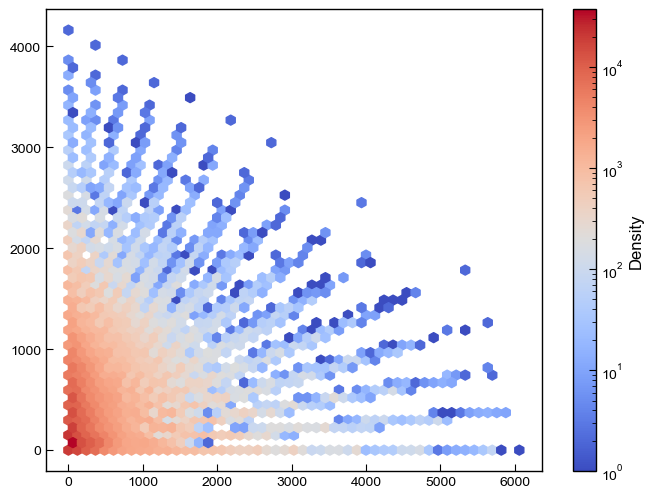

In [34]:
# Create the plot
fig, ax = plt.subplots(figsize=(8, 6))

# Use hexbin to create a heatmap for the data
hb = ax.hexbin(df['M_Rd'], df['V_Rd'], gridsize=50, cmap='coolwarm', 
            mincnt=1, norm=LogNorm())

# Add color bar to represent the density
cb = fig.colorbar(hb, ax=ax)
cb.set_label('Density')


# Show the plot
plt.show()

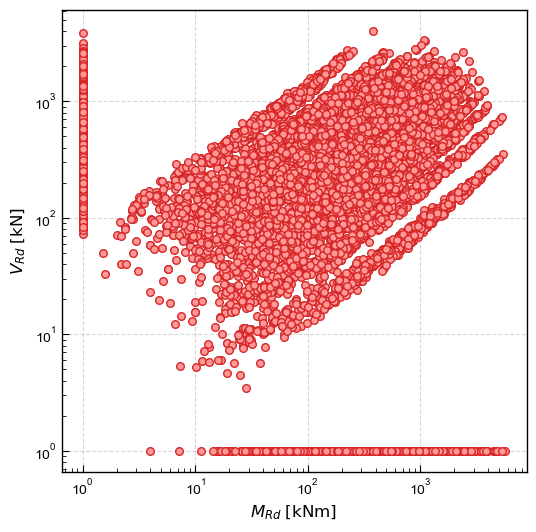

In [103]:
fig, ax = plt.subplots(figsize=(6, 6))

plt.scatter(df_reduced['M_Rd']+1,df_reduced['V_Rd']+1,
            facecolor=plot_params.morecolors[7],
            edgecolor=plot_params.morecolors[6],
            s=30.0,
            zorder=2)

plt.xlabel('$M_{Rd}$ $\mathrm{[kNm]}$')
plt.ylabel('$V_{Rd}$ $\mathrm{[kN]}$')
plt.grid(True, linestyle='--', alpha=0.5,zorder=0)
plt.yscale('log')
plt.xscale('log')

plt.show()

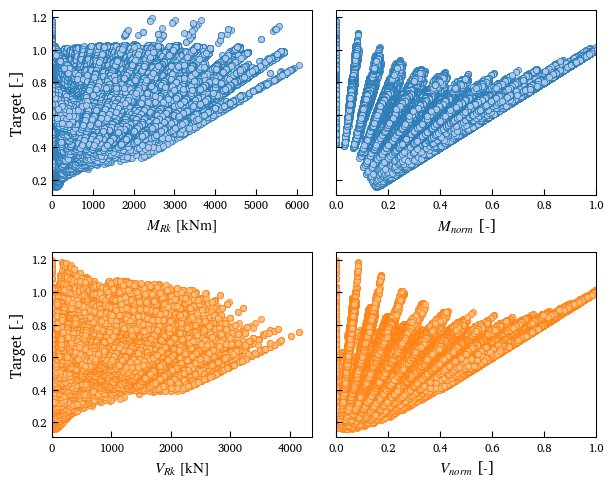

In [11]:
fig, axs = plt.subplots(2,2, figsize=plot_params.get_figsize(1.0,0.8),sharey=True)

axs[0,0].scatter(df['M_Rd'], df['target'],
                 facecolor=plot_params.morecolors[1],
                 edgecolor=plot_params.morecolors[0], s=20,
                 linewidth=0.5)
axs[1,0].scatter(df['V_Rd'], df['target'],
                 facecolor=plot_params.morecolors[3],
                 edgecolor=plot_params.morecolors[2], s=20,
                 linewidth=0.5)

axs[0,1].scatter(df['M_norm'], df['target'],
                 facecolor=plot_params.morecolors[1],
                 edgecolor=plot_params.morecolors[0], s=20,
                 linewidth=0.5)
axs[1,1].scatter(df['V_norm'], df['target'],
                 facecolor=plot_params.morecolors[3],
                 edgecolor=plot_params.morecolors[2], s=20,
                 linewidth=0.5)

axs[0,0].set_ylabel('Target [-]')
axs[1,0].set_ylabel('Target [-]')
axs[1,0].set_xlabel('$V_{Rk}$ $\mathrm{[kN]}$')
axs[0,0].set_xlabel('$M_{Rk}$ $\mathrm{[kNm]}$')
axs[1,1].set_xlabel('$V_{norm}$ [-]')
axs[0,1].set_xlabel('$M_{norm}$ [-]')

axs[0,0].set_xlim(0,None)
axs[1,0].set_xlim(0,None)
axs[0,1].set_xlim(0,1)
axs[1,1].set_xlim(0,1)

plt.tight_layout()

if plot_params.save_figures:
    plt.savefig(r'Plots\VIS_Target.png', format='png')

plt.show()

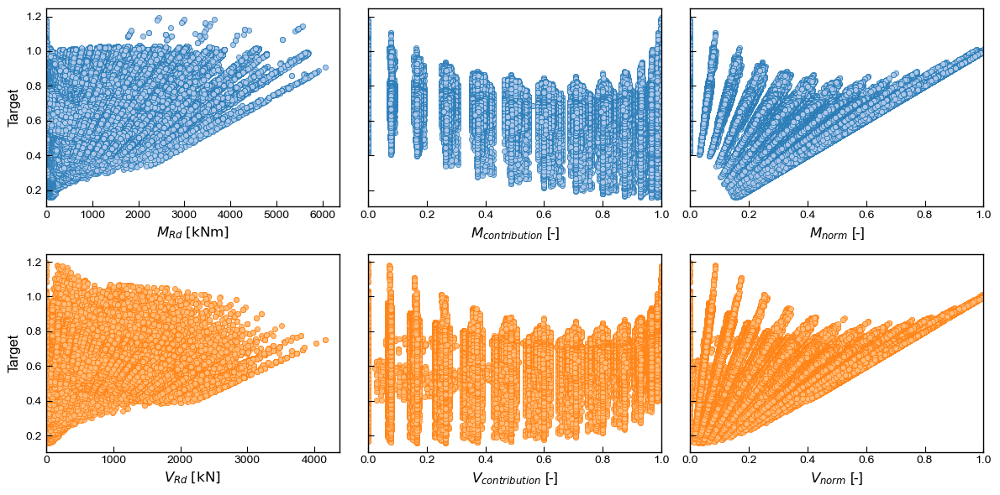

In [91]:
fig, axs = plt.subplots(2,3, figsize=(12, 6),sharey=True)

axs[0,0].scatter(df['M_Rd'], df['target'],
                 facecolor=plot_params.morecolors[1],
                 edgecolor=plot_params.morecolors[0], s=20,
                 linewidth=0.5)
axs[1,0].scatter(df['V_Rd'], df['target'],
                 facecolor=plot_params.morecolors[3],
                 edgecolor=plot_params.morecolors[2], s=20,
                 linewidth=0.5)

axs[0,1].scatter(df['M_contribution'], df['target'],
                 facecolor=plot_params.morecolors[1],
                 edgecolor=plot_params.morecolors[0], s=20,
                 linewidth=0.5)
axs[1,1].scatter(df['V_contribution'], df['target'],
                 facecolor=plot_params.morecolors[3],
                 edgecolor=plot_params.morecolors[2], s=20,
                 linewidth=0.5)

axs[0,2].scatter(df['M_norm'], df['target'],
                 facecolor=plot_params.morecolors[1],
                 edgecolor=plot_params.morecolors[0], s=20,
                 linewidth=0.5)
axs[1,2].scatter(df['V_norm'], df['target'],
                 facecolor=plot_params.morecolors[3],
                 edgecolor=plot_params.morecolors[2], s=20,
                 linewidth=0.5)

axs[0,0].set_ylabel('Target')
axs[1,0].set_ylabel('Target')
axs[1,0].set_xlabel('$V_{Rd}$ $\mathrm{[kN]}$')
axs[0,0].set_xlabel('$M_{Rd}$ $\mathrm{[kNm]}$')
axs[0,1].set_xlabel('$M_{contribution}$ [-]')
axs[1,1].set_xlabel('$V_{contribution}$ [-]')
axs[1,2].set_xlabel('$V_{norm}$ [-]')
axs[0,2].set_xlabel('$M_{norm}$ [-]')

axs[0,0].set_xlim(0,None)
axs[1,0].set_xlim(0,None)
axs[0,1].set_xlim(0,1)
axs[1,1].set_xlim(0,1)
axs[0,2].set_xlim(0,1)
axs[1,2].set_xlim(0,1)

plt.tight_layout()
plt.show()

## Correlation

In [16]:
features = ["A_x", "Iy_x", "Wply_x", "fy_x", 
                    "A_y", "Iy_y", "Wply_y", "fy_y", 
                    "Gamma", "Offset",
                    "h_wid", "b_wid", "d_wid", "t_fwid", "t_wwid", 
                    "t_stiffc"] 

In [17]:
# Assuming df is your DataFrame
pearson_corr = df[features].corr(method='pearson')
spearman_corr = df[features].corr(method='spearman')
kendall_corr = df[features].corr(method='kendall')

In [24]:
labelnames = [plot_params.feature_labels[key] for key in features]

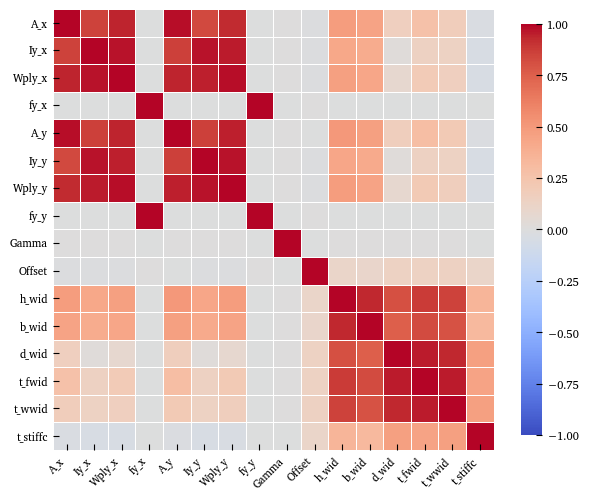

In [37]:
plt.figure(figsize=plot_params.get_figsize(1.0, 0.9))
sns.heatmap(pearson_corr, annot=False, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1, square=True,
            linewidths=0.5, cbar_kws={"shrink": 0.8})
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
if plot_params.save_figures:
    plt.savefig(r'Plots\VIS_CorrMatrix.png', format='png')
plt.show()


In [29]:
pearson_corr_to_target = df[features + ['target']].corr(method='pearson')['target'].drop('target')
spearman_corr_to_target = df[features + ['target']].corr(method='spearman')['target'].drop('target')
kendall_corr_to_target = df[features + ['target']].corr(method='kendall')['target'].drop('target')

In [30]:
correlations = pd.DataFrame({
    'Pearson': pearson_corr_to_target,
    'Spearman': spearman_corr_to_target,
    'Kendall': kendall_corr_to_target
})

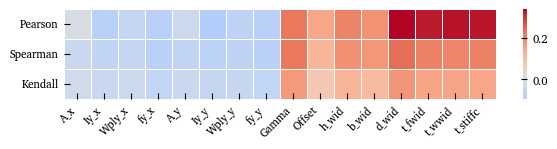

In [38]:
plt.figure(figsize=plot_params.get_figsize(1.0, 0.26))
sns.heatmap(correlations.T, annot=False, fmt=".2f", cmap="coolwarm", center=0,
            linewidths=0.5, cbar_kws={"shrink": 1.0}, annot_kws={"size": 12})
plt.yticks(rotation=0)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
if plot_params.save_figures:
    plt.savefig(r'Plots\VIS_CorrMatrixsmall.png', format='png')
plt.show()

In [57]:
correlations

,pearson,spearman,kendall
A_x,-0.014189,-0.045901,-0.032971
Iy_x,-0.081505,-0.064180,-0.046282
Wely_x,-0.054381,-0.058971,-0.042614
Wply_x,-0.055485,-0.057992,-0.041863
fy_x,-0.079843,-0.082616,-0.061644
A_y,-0.039942,-0.064503,-0.045518
Iy_y,-0.093065,-0.073793,-0.052782
Wely_y,-0.069220,-0.071717,-0.051169
Wply_y,-0.070730,-0.071804,-0.051135
fy_y,-0.079843,-0.082616,-0.061644


## Profile Combinations

In [6]:
df_profile_combinations = df[['Profile_x', 'Profile_y']]

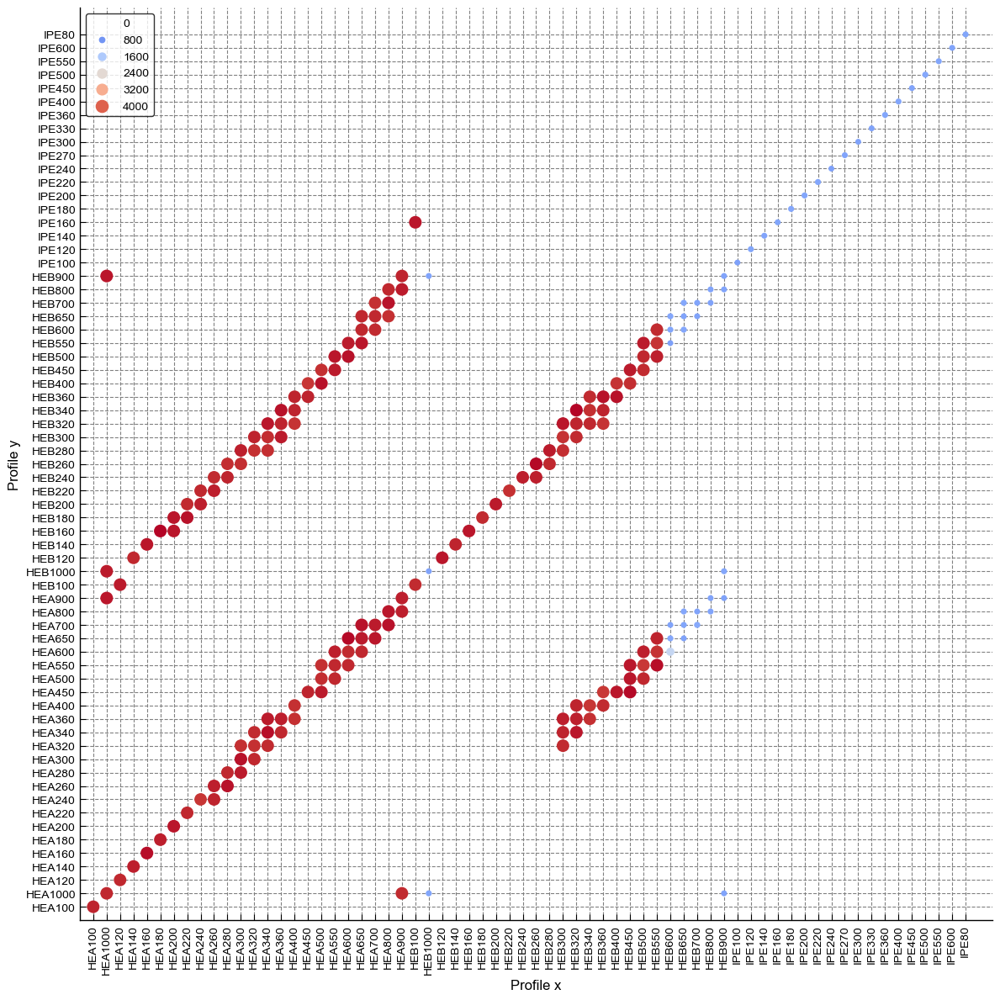

In [182]:
# Create a combination matrix
comb_matrix = pd.crosstab(df["Profile_x"], df["Profile_y"])

# Convert matrix to long format for scatterplot
comb_long = comb_matrix.stack().reset_index().rename(columns={0: "Count"})

# Scatterplot heatmap
plt.figure(figsize=(12, 12))
ax = sns.scatterplot(
    data=comb_long, x="Profile_x", y="Profile_y",
    size="Count", hue="Count", sizes=(0, 120), palette="coolwarm", edgecolor="black",
    zorder=1
)

# Formatting
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')
ax.xaxis.grid(color='gray', linestyle='dashed')

plt.xticks(rotation=90)
plt.xlabel("Profile x")
plt.ylabel("Profile y")
#plt.legend(title="Count", loc="upper right", bbox_to_anchor=(1.25, 1))
sns.despine()

legend = plt.legend(loc="upper left",
                        frameon=True,
                        fancybox=True)
legend.get_frame().set_edgecolor("black")
legend.get_frame().set_linewidth(1)

plt.xlim([-1,len(df['Profile_x'].unique())+1])
plt.ylim([-1,len(df['Profile_y'].unique())+1])

# Tight layout to minimize space around the plot
plt.tight_layout()

plt.show()

In [ ]:
def plot_discretized_heatmap(df, col1, col2, n_bins, savename=None):
    df[f'{col1}_binned'] = pd.cut(df[col1], bins=n_bins, labels=False)
    df[f'{col2}_binned'] = pd.cut(df[col2], bins=n_bins, labels=False)

    comb_matrix = pd.crosstab(df[f'{col1}_binned'], df[f'{col2}_binned'])
    comb_long = comb_matrix.stack().reset_index().rename(columns={0: "Count"})

    fig, ax = plt.subplots(figsize=plot_params.get_figsize(0.6, 1.0))
    ax = sns.scatterplot(
        data=comb_long, x=f'{col1}_binned', y=f'{col2}_binned',
        size="Count", hue="Count", sizes=(0, 180), palette="coolwarm", edgecolor="black",
        zorder=1
    )

    ax.set_axisbelow(True)
    ax.yaxis.grid(color='gray', linestyle='dashed')
    ax.xaxis.grid(color='gray', linestyle='dashed')

    plt.xlabel(f"{plot_params.feature_labels[col1]}")
    plt.ylabel(f"{plot_params.feature_labels[col2]}")
    sns.despine()

    legend = plt.legend(loc="upper left", frameon=True, fancybox=True, title="Count")
    legend.get_frame().set_edgecolor("black")
    legend.get_frame().set_linewidth(1)
    
    for text in legend.get_texts():
        text.set_text(f'{float(text.get_text()):.1e}')

    plt.xlim([-0.05*np.nanmax(df[f'{col1}_binned']), 1.05*np.nanmax(df[f'{col1}_binned'])])
    plt.ylim([-0.05*np.nanmax(df[f'{col2}_binned']), 1.05*np.nanmax(df[f'{col2}_binned'])])

    plt.tight_layout()

    if savename is not None:
        plt.savefig(savename, format="svg")

    plt.show()


In [10]:
df

,Profile_x,h_x,b_x,tw_x,tf_x,A_x,Av_x,Iy_x,Wely_x,Wply_x,...,M_Rd,V_Rd,V_contribution,M_contribution,V_norm,M_norm,target,Cat_h,Cat_t_stiffc,cost
0,HEA100,96,100,5.0,8.0,2123.610658,755.610658,3492000,72760.0,83010,...,7.641830,3.089307,0.076696,0.997054,0.030134,0.391741,0.392898,0,0,NaN
1,HEA100,96,100,5.0,8.0,2123.610658,755.610658,3492000,72760.0,83010,...,7.511201,6.579080,0.164399,0.986394,0.064174,0.385045,0.390356,0,0,NaN
2,HEA100,96,100,5.0,8.0,2123.610658,755.610658,3492000,72760.0,83010,...,6.858053,20.023286,0.485643,0.874157,0.195312,0.351563,0.402173,0,0,NaN
3,HEA100,96,100,5.0,8.0,2123.610658,755.610658,3492000,72760.0,83010,...,6.618565,26.087481,0.600000,0.800000,0.254464,0.339286,0.424107,0,0,NaN
4,HEA100,96,100,5.0,8.0,2123.610658,755.610658,3492000,72760.0,83010,...,6.286548,33.038422,0.707107,0.707107,0.322266,0.322266,0.455752,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
714380,HEB600,600,300,15.5,30.0,26995.778956,11080.778956,1710000000,5701000.0,6425000,...,0.000000,1021.848984,1.000000,0.000000,0.729880,0.000000,0.729880,1,1,372.156991
714381,HEB600,600,300,15.5,30.0,26995.778956,11080.778956,1710000000,5701000.0,6425000,...,830.346199,459.328547,0.495037,0.868872,0.328086,0.575846,0.662751,1,1,807.747298
714382,HEB600,600,300,15.5,30.0,26995.778956,11080.778956,1710000000,5701000.0,6425000,...,505.538281,671.164844,0.807179,0.590306,0.479395,0.350591,0.593914,1,1,807.747298
714383,HEB600,600,300,15.5,30.0,26995.778956,11080.778956,1710000000,5701000.0,6425000,...,406.537160,728.633805,0.879273,0.476318,0.520444,0.281934,0.591902,1,1,807.747298


In [6]:
import matplotlib.ticker as ticker

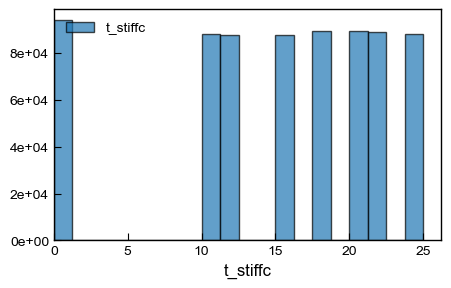

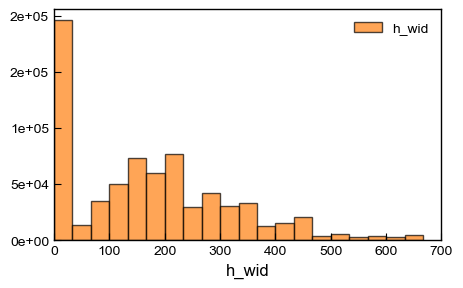

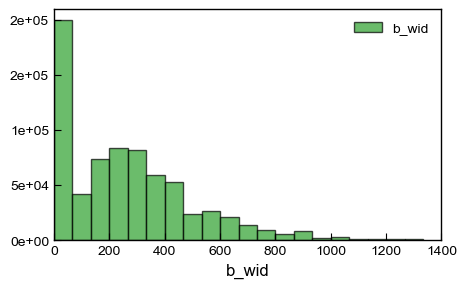

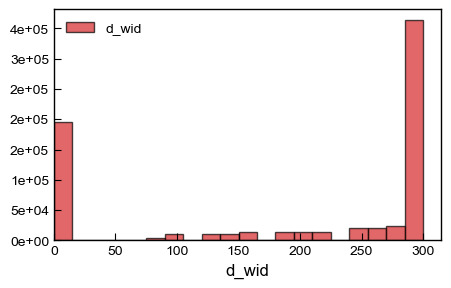

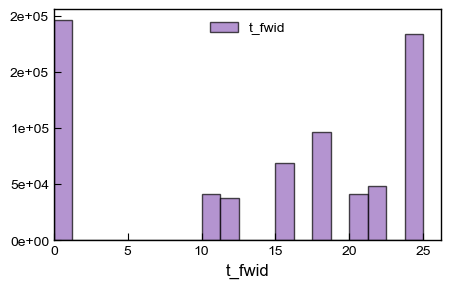

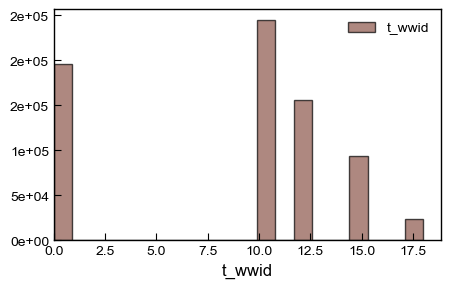

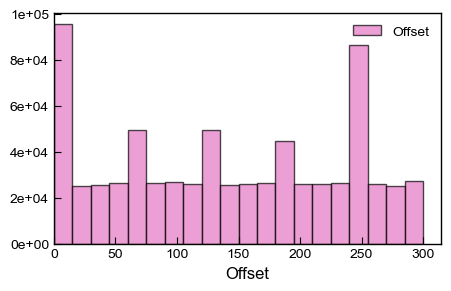

In [201]:
features = ['t_stiffc', 'h_wid', 'b_wid', 'd_wid', 't_fwid', 't_wwid', 'Offset']

for i,feature in enumerate(features):
    fig, ax = plt.subplots(figsize=(5, 3))
    plt.hist(df[feature].fillna(0), bins=20, color=plot_params.colors[i], edgecolor='black', alpha=0.7,
             label=feature)
    
    # Format the y-axis to show the scientific notation at the top only
    ax = plt.gca()
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:0.0e}'))

    plt.xlabel(feature)
    plt.xlim([0,None])
    plt.legend()
    plt.show()

In [48]:
pairs = [('A_x', 'A_y'), ('d_wid', 'h_wid'), ('Offset', 'A_x'), ('Iy_x', 'V_Rd'),('tf_x', 'tf_y'),('tw_x', 'tw_y'),('t_stiffc', 'Gamma'),('M_Rd', 'V_Rd'),('A_x','b_wid')]

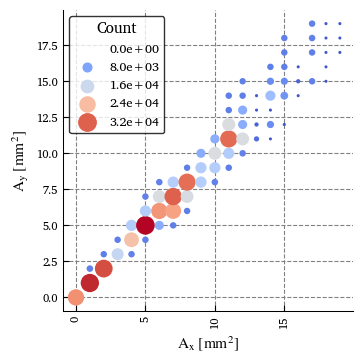

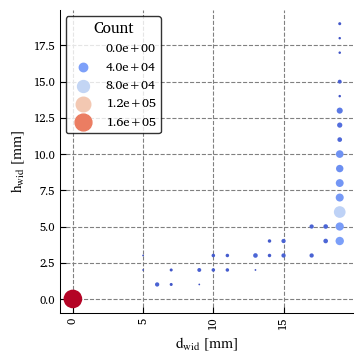

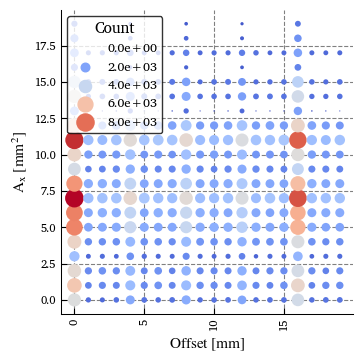

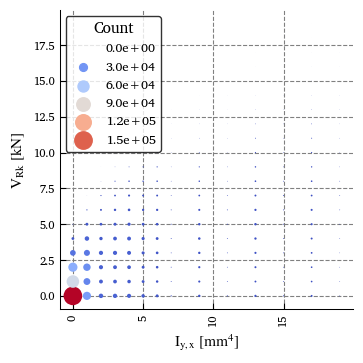

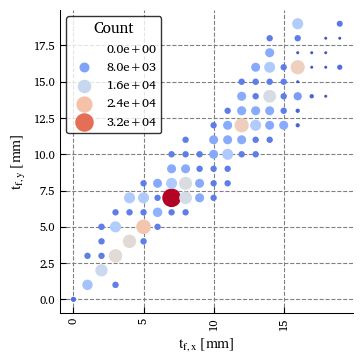

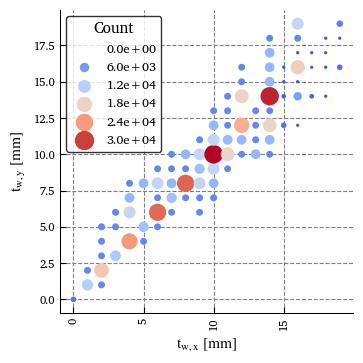

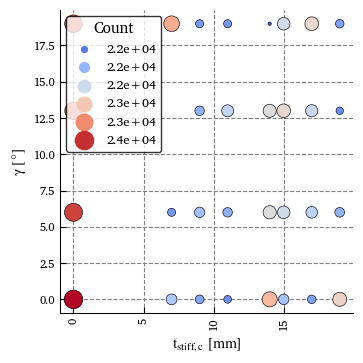

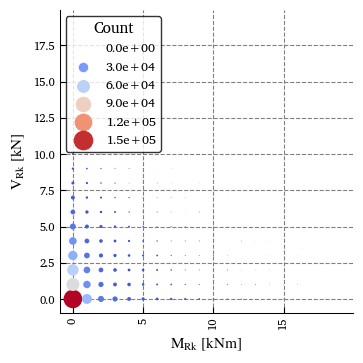

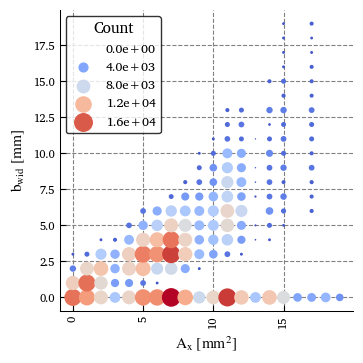

In [49]:
for pair in pairs:
    plot_discretized_heatmap(df, pair[0], pair[1], 20, savename=f"Plots\VIS_{pair[0]}_{pair[1]}.svg")

In [119]:
def plot_2D_density(row):
    col1, col2 = row['pairs'][0], row['pairs'][1]
    # Create the plot
    fig, ax = plt.subplots(figsize=(8, 6))

    # Use hexbin to create a heatmap for the data
    hb = ax.hexbin(df[col1], df[col2], gridsize=20, cmap='coolwarm', 
                mincnt=1, norm=LogNorm())

    # Add color bar to represent the density
    cb = fig.colorbar(hb, ax=ax)
    cb.set_label('Density')

    # Titles and labels
    ax.set_xlabel(f'{col1} [{row["unit"]}]')
    ax.set_ylabel(f'{col2} [{row["unit"]}]')

    # Show the plot
    plt.show()

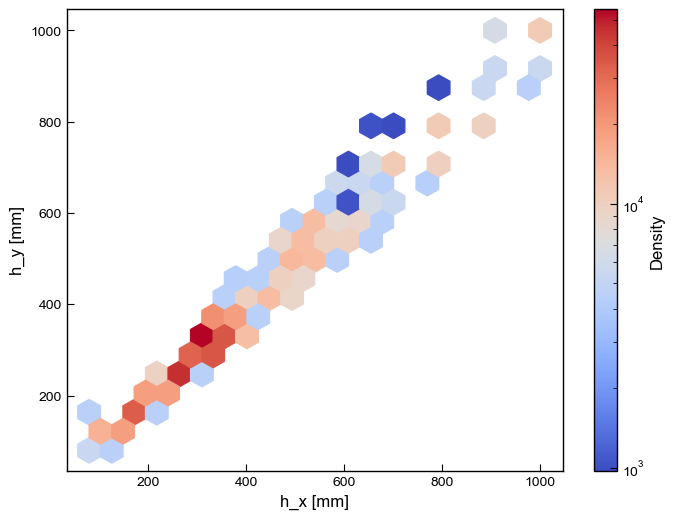

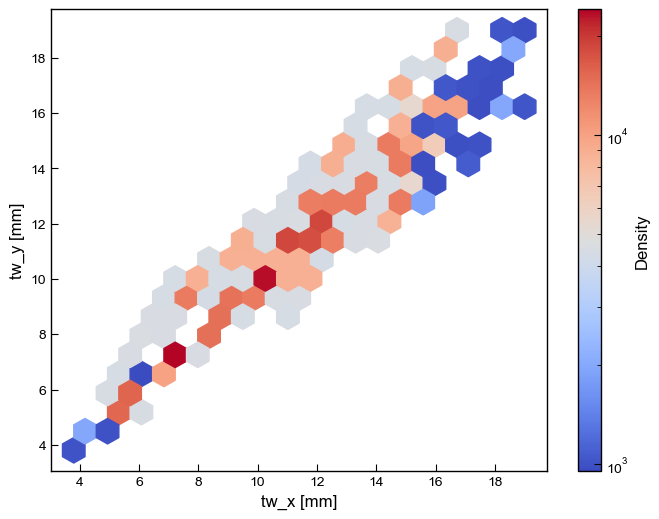

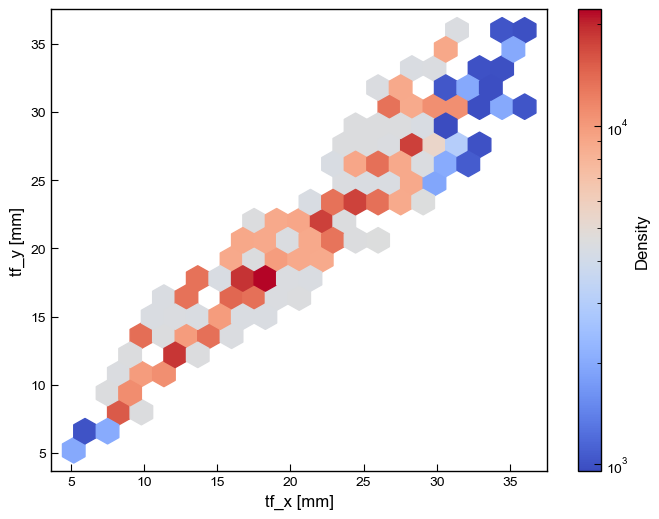

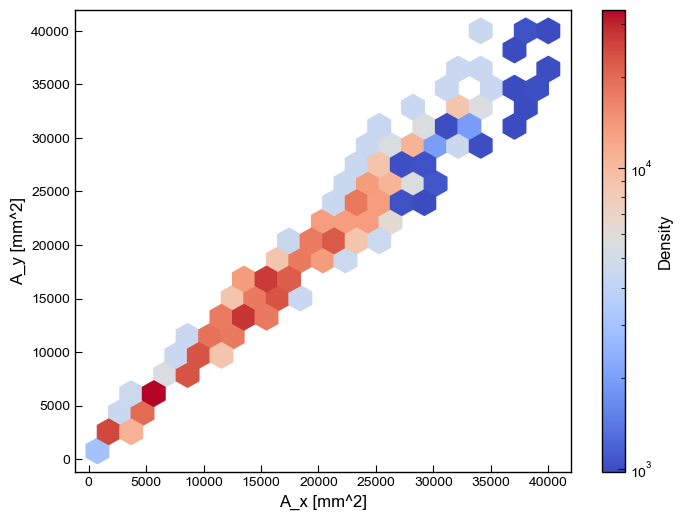

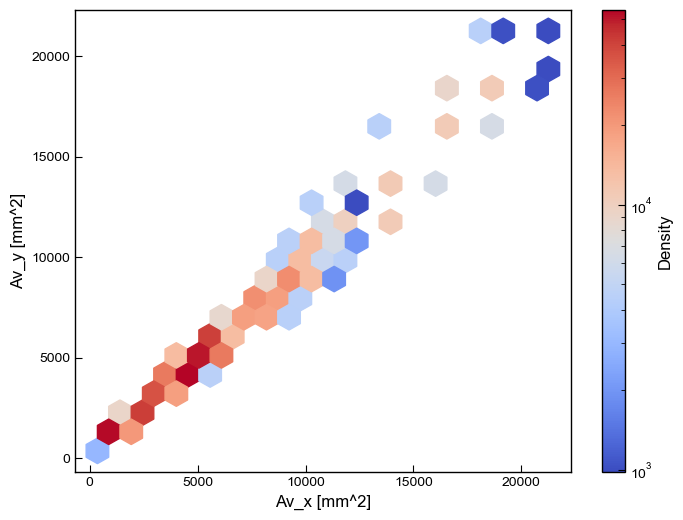

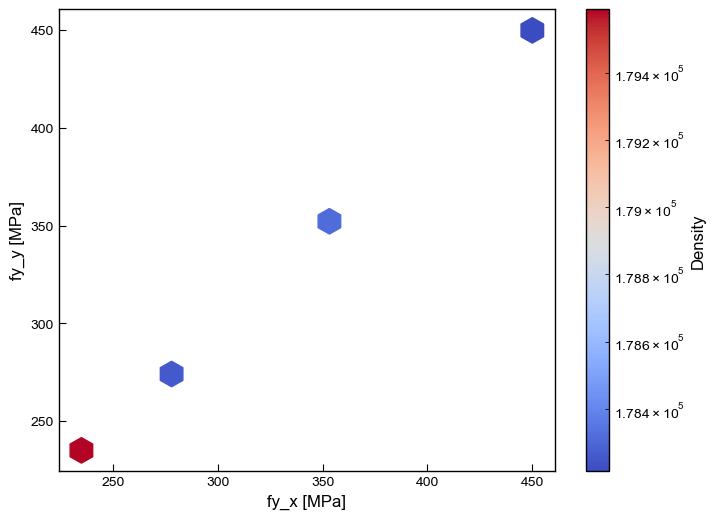

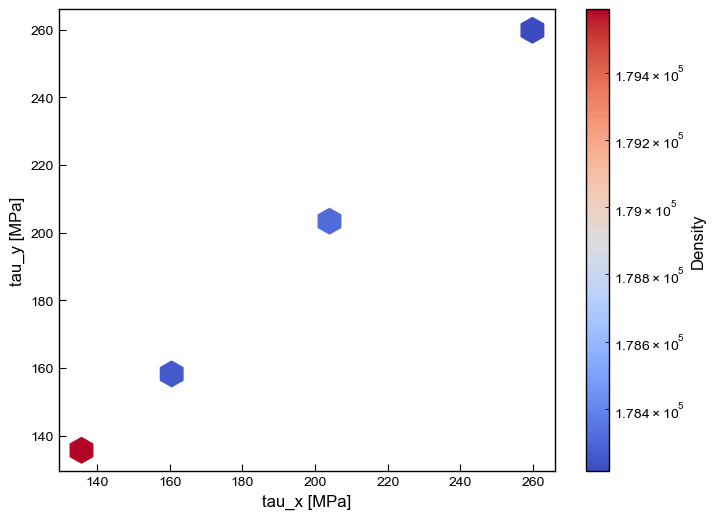

In [120]:
for i,row in df_pairs.iterrows():
    plot_2D_density(row)

## Analysis

In [5]:
df.sample(100)

,Profile_x,h_x,b_x,tw_x,tf_x,A_x,Av_x,Iy_x,Wely_x,Wply_x,...,M_Rd,V_Rd,V_contribution,M_contribution,V_norm,M_norm,target,Cat_h,Cat_t_stiffc,cost
234978,HEA200,190,200,6.5,10.0,5383.123980,1808.123980,36920000,388600.0,429500,...,99.447422,181.064297,0.600003,0.799997,0.436440,0.581914,0.727395,1,1,203.503390
427773,HEA600,590,300,13.0,25.0,22645.778956,9320.778956,1412000000,4787000.0,5350000,...,262.545609,994.766156,0.964764,0.263117,0.626116,0.170759,0.648983,1,1,738.776892
335455,HEA340,330,300,9.5,16.5,13347.278956,4495.028956,276900000,1678000.0,1850000,...,0.000000,791.665156,1.000000,0.000000,0.746093,0.000000,0.746093,1,1,248.502886
227961,HEA200,190,200,6.5,10.0,5383.123980,1808.123980,36920000,388600.0,429500,...,55.647363,101.440777,0.600002,0.799998,0.413502,0.551332,0.689167,1,1,127.482902
548808,HEB220,220,220,9.5,16.0,9104.123980,2792.123980,80910000,735500.0,827000,...,39.530215,282.534961,0.964764,0.263116,0.745814,0.203402,0.773053,1,1,215.555250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235210,HEA200,190,200,6.5,10.0,5383.123980,1808.123980,36920000,388600.0,429500,...,93.833125,38.010957,0.164399,0.986394,0.080915,0.485490,0.492187,1,1,80.669951
597634,HEB320,320,300,11.5,20.5,16134.278956,5177.028956,308200000,1926000.0,2149000,...,348.252750,132.101250,0.250646,0.968079,0.175429,0.677567,0.699909,1,1,476.740931
702672,HEB550,550,300,15.0,29.0,25405.778956,10006.778956,1367000000,4971000.0,5591000,...,173.531875,1036.735563,0.986394,0.164399,0.589285,0.098214,0.597414,1,1,727.267482
144123,HEB900,900,300,18.5,35.0,37127.566612,18875.066612,4941000000,10980000.0,12580000,...,2919.357952,676.792845,0.268664,0.963234,0.178916,0.641462,0.665946,0,1,427.607653


In [6]:
# Define features and target
features = ["A_x", "Iy_x", "Wely_x", "Wply_x", "fy_x",
            "A_y", "Iy_y", "Wely_y", "Wply_y", "fy_y",
            "Gamma", "Offset", "h_wid", "b_wid", "d_wid", "t_fwid", "t_wwid", 
            "t_stiffc", "V_contribution", "M_contribution"]
target = "target"

# Select a subset of the data
df_subset = df.sample(10_000)

X = df_subset[features].values
y = df_subset[target].values

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [7]:
### 1. Permutation Feature Importance ###
# Train a simple Random Forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_scaled, y)

# Compute feature importance
perm_importance = permutation_importance(rf, X_scaled, y, n_repeats=10, random_state=42)
importance_df = pd.DataFrame({"Feature": features, "Importance": perm_importance.importances_mean})
importance_df = importance_df.sort_values(by="Importance", ascending=False)

print("\nPermutation Feature Importance:\n", importance_df)


Permutation Feature Importance:
            Feature  Importance
17        t_stiffc    0.456508
10           Gamma    0.427997
18  V_contribution    0.372711
19  M_contribution    0.338625
13           b_wid    0.162130
12           h_wid    0.136326
1             Iy_x    0.086428
11          Offset    0.077192
0              A_x    0.076751
5              A_y    0.058298
14           d_wid    0.036382
6             Iy_y    0.032154
3           Wply_x    0.017445
2           Wely_x    0.016426
15          t_fwid    0.011293
7           Wely_y    0.007772
8           Wply_y    0.007608
4             fy_x    0.006482
9             fy_y    0.005679
16          t_wwid    0.005337


feature importnace mit DNN SHAD values (Sensitivity)

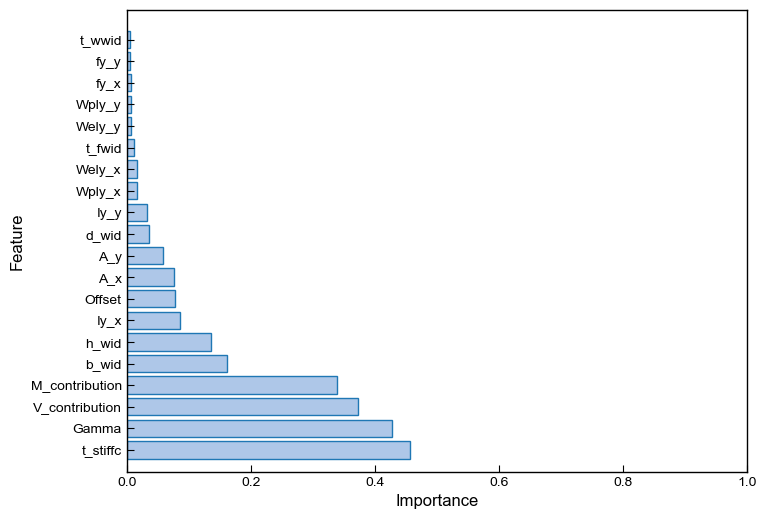

In [9]:
fig, ax = plt.subplots(figsize=(8, 6))

plt.barh(importance_df["Feature"], importance_df["Importance"], 
         color=plot_params.morecolors[1],
         edgecolor=plot_params.morecolors[0])

plt.xlabel("Importance")
plt.ylabel("Feature")

plt.ylim([-1.0,None])
plt.xlim([0.0,1.0])

plt.show()

permutation plots

In [10]:
### 2. K-Means Clustering ###
kmeans = KMeans(n_clusters=10, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(X_scaled)

In [11]:
# Apply PCA
pca = PCA(n_components=2)  # Adjust number of components as needed
X_pca = pca.fit_transform(X_scaled)

# Explained variance ratio
explained_variance = pca.explained_variance_ratio_
print("\nExplained Variance Ratio:", explained_variance)
print("Cumulative Explained Variance:", np.cumsum(explained_variance))


Explained Variance Ratio: [0.42531514 0.20281285]
Cumulative Explained Variance: [0.42531514 0.62812799]


In [15]:
### 3. DBSCAN Clustering ###
dbscan = DBSCAN(eps=1.5, min_samples=10)
dbscan_labels = dbscan.fit_predict(X_scaled)

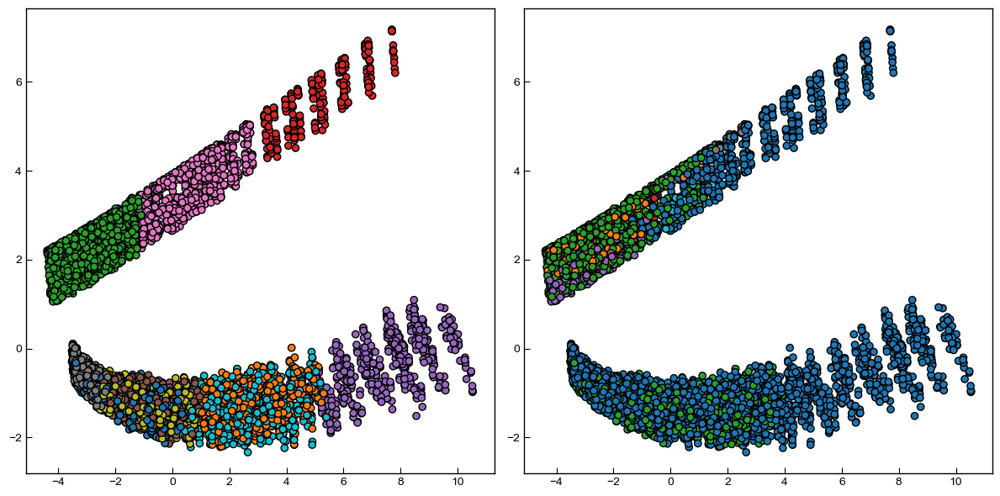

In [23]:
fig, axs = plt.subplots(1,2,figsize=(12, 6))

axs[0].scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans_labels, cmap='tab10', edgecolor='black')
axs[1].scatter(X_pca[:, 0], X_pca[:, 1], c=dbscan_labels, cmap='tab10', edgecolor='black')

plt.tight_layout()
plt.show()

In [13]:
tsne = TSNE(n_components=2, random_state=42) 
X_tsne = tsne.fit_transform(X_scaled)

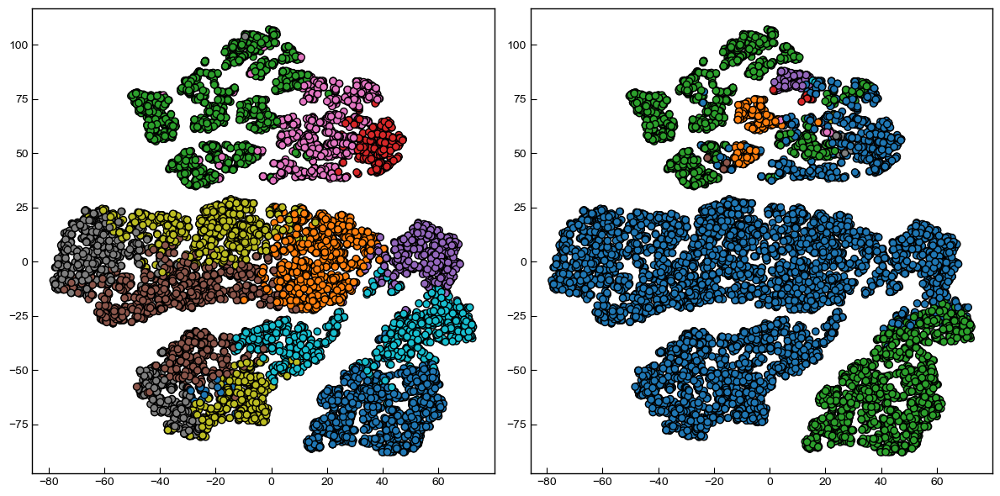

In [25]:
fig, axs = plt.subplots(1,2,figsize=(12, 6))

axs[0].scatter(X_tsne[:, 0], X_tsne[:, 1], c=kmeans_labels, cmap='tab10', edgecolor='black')
axs[1].scatter(X_tsne[:, 0], X_tsne[:, 1], c=dbscan_labels, cmap='tab10', edgecolor='black')

plt.tight_layout()

plt.show()

In [27]:
import plotly.express as px

df_tsne = df.loc[:10000-1].copy()

hover_features = ['Profile_x', 'h_x', 'b_x', 'tw_x', 'tf_x', 
                  'Steel grade_x', 'fy_x', 'tau_x', 'Vpl_x', 'Mpl_x',
       'Profile_y', 'h_y', 'b_y', 'tw_y', 'tf_y', 
       'Steel grade_y', 'fy_y', 'tau_y', 'Vpl_y', 'Mpl_y',
       'Gamma', 't_stiffc', 'h_wid', 'b_wid', 'd_wid', 't_fwid', 't_wwid',
       't_stiffb', 'Offset', 'Offset_Idea', 'M_Rd', 'V_Rd',
       'V_contribution', 'M_contribution', 'target',
       'Cat_h', 'Cat_t_stiffc']

# Add t-SNE components and KMeans cluster labels to the DataFrame
df_tsne["TSNE_1"] = X_tsne[:, 0]
df_tsne["TSNE_2"] = X_tsne[:, 1]
df_tsne["KMeans_Cluster"] = kmeans_labels

# Create an interactive scatter plot with Plotly
fig = px.scatter(df_tsne, x="TSNE_1", y="TSNE_2", 
                 color="KMeans_Cluster",  # Color by KMeans cluster
                 hover_data=hover_features,  # Display other information on hover
                 title="t-SNE with KMeans Clusters",
                 color_continuous_scale='viridis')  # You can choose other color scales

# Customize figure size
fig.update_layout(
    autosize=False,
    width=1400,  # Width of the plot
    height=1000,  # Height of the plot
)

## Correlation Metrics

**Pearson Correlation**
- **Description**: Measures the linear relationship between two variables.
- **Assumptions**: Assumes linearity and normality.
- **Value Range**: -1 to 1  
  - 1: Perfect positive linear relationship  
  - 0: No linear relationship  
  - -1: Perfect negative linear relationship

**Spearman Correlation**
- **Description**: Measures the strength and direction of the monotonic relationship between two variables.
- **Assumptions**: No assumption about linearity; works with rank values.
- **Value Range**: -1 to 1  
  - 1: Perfect positive monotonic relationship  
  - 0: No monotonic relationship  
  - -1: Perfect negative monotonic relationship

**Kendall Tau**
- **Description**: Measures ordinal association between two variables, assessing the consistency of rankings.
- **Assumptions**: No assumption about linearity; works with ranks.
- **Value Range**: -1 to 1  
  - 1: Perfect agreement in rankings  
  - 0: No association in rankings  
  - -1: Perfect disagreement in rankings

**Mutual Information**
- **Description**: Measures the amount of information shared between two variables, capturing any type of statistical dependence.
- **Assumptions**: No assumptions on the type of relationship.
- **Value Range**: 0 to ∞  
  - 0: Variables are independent  
  - Higher values: Stronger dependency between variables

In [10]:
def get_feature_correlations(X, features):
    results = []
    
    # Iterate through pairs of features
    for i, feature_1 in enumerate(features):
        for j, feature_2 in enumerate(features):
            if i >= j:  # Skip duplicate pairs (feature_1 vs feature_2 and feature_2 vs feature_1)
                continue

            print('Calculating correlation between', feature_1, 'and', feature_2)
            
            feature_1_values = X[:, i]
            feature_2_values = X[:, j]

            # 1. Pearson Correlation
            try:
                pearson_corr, p_value = stats.pearsonr(feature_1_values, feature_2_values)
            except:
                pearson_corr = np.nan
                p_value = np.nan
            
            # 2. Spearman Rank Correlation
            spearman_corr, spearman_pval = stats.spearmanr(feature_1_values, feature_2_values, nan_policy='omit')
            
            # 3. Mutual Information
            try:
                # Reshape for sklearn's API
                mi = mutual_info_regression(feature_1_values.reshape(-1, 1), feature_2_values)[0]
            except:
                mi = np.nan
            
            # 4. Kendall's Tau (another rank correlation)
            kendall_tau, kendall_pval = stats.kendalltau(feature_1_values, feature_2_values, nan_policy='omit')
            
            results.append({
                'Feature 1': feature_1,
                'Feature 2': feature_2,
                'Pearson Correlation': pearson_corr,
                'Pearson p-value': p_value,
                'Spearman Correlation': spearman_corr,
                'Spearman p-value': spearman_pval,
                'Kendall Tau': kendall_tau,
                'Kendall p-value': kendall_pval,
                'Mutual Information': mi
            })
    
    # Convert to DataFrame and return the result
    result_df = pd.DataFrame(results)
    return result_df

In [ ]:
features = ["A_x", "Iy_x", "Wely_x", "Wply_x", "fy_x", 
                    "A_y", "Iy_y", "Wely_y", "Wply_y", "fy_y", 
                    "Gamma", "Offset",
                    "h_wid", "b_wid", "d_wid", "t_fwid", "t_wwid", 
                    "t_stiffc",
                    "V_contribution", "M_contribution"] 

# do not include V_contribution and M_contribution because they have a natural tendency to be correlated

features = ["A_x", "Iy_x", "Wely_x", "Wply_x", "fy_x", 
                    "A_y", "Iy_y", "Wely_y", "Wply_y", "fy_y", 
                    "Gamma", "Offset",
                    "h_wid", "b_wid", "d_wid", "t_fwid", "t_wwid", 
                    "t_stiffc"]

df_reduced = df.sample(n=50_000)
df_numeric = df_reduced[features]

X_data = df_numeric.to_numpy().astype(np.float32)

scaler = StandardScaler() # Scale the data to get meaningful correlation values
X_data = scaler.fit_transform(X_data)

In [183]:
# Compute feature correlations
df_corr = get_feature_correlations(X_data, features)

Calculating correlation between A_x and Iy_x
Calculating correlation between A_x and Wely_x
Calculating correlation between A_x and Wply_x
Calculating correlation between A_x and fy_x
Calculating correlation between A_x and A_y
Calculating correlation between A_x and Iy_y
Calculating correlation between A_x and Wely_y
Calculating correlation between A_x and Wply_y
Calculating correlation between A_x and fy_y
Calculating correlation between A_x and Gamma
Calculating correlation between A_x and Offset
Calculating correlation between A_x and h_wid
Calculating correlation between A_x and b_wid
Calculating correlation between A_x and d_wid
Calculating correlation between A_x and t_fwid
Calculating correlation between A_x and t_wwid
Calculating correlation between A_x and t_stiffc
Calculating correlation between Iy_x and Wely_x
Calculating correlation between Iy_x and Wply_x
Calculating correlation between Iy_x and fy_x
Calculating correlation between Iy_x and A_y
Calculating correlation bet

In [188]:
df_corr['Normalized Mutual Information'] = scaler.fit_transform(df_corr['Mutual Information'].values.reshape(-1, 1))

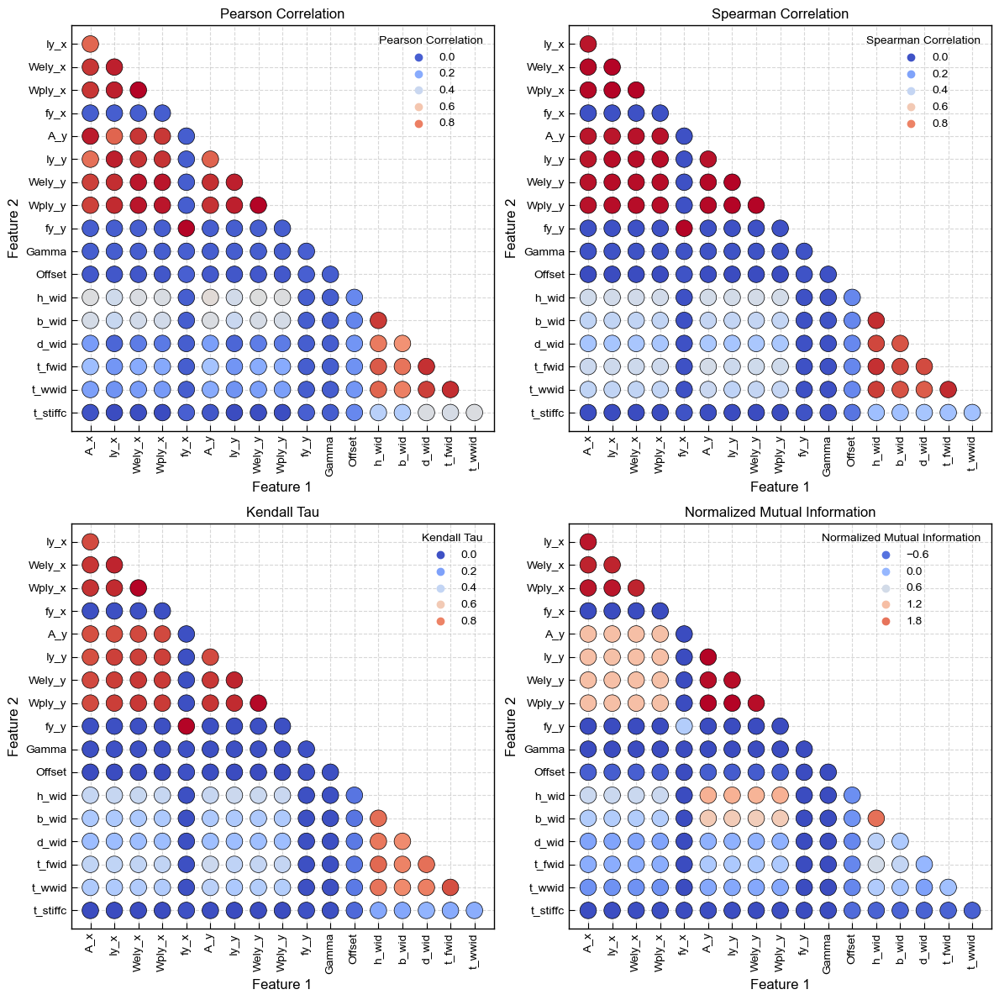

In [189]:
# Plot using Seaborn scatterplot
fig, axs = plt.subplots(2,2, figsize=(12, 12))

for j,correlation_name in enumerate(['Pearson Correlation', 'Spearman Correlation', 'Kendall Tau', 'Normalized Mutual Information']):
    ax = axs[j // 2, j % 2]
    # Get feature names
    num_features = len(features)

    # Initialize full n x n matrix
    correlation_matrix = np.full((num_features, num_features), np.nan)

    # Fill lower triangular part of the matrix
    for i, feature in enumerate(features):  
        corr_values = df_corr[df_corr['Feature 1'] == feature][correlation_name].values
        correlation_matrix[i,i+1:len(features)] = corr_values  # Correct indexing

    # Convert to DataFrame
    corr_df = pd.DataFrame(correlation_matrix, index=features, columns=features)

    # Melt for Seaborn
    corr_long = corr_df.reset_index().melt(id_vars='index', var_name='Feature 2', value_name=correlation_name)
    corr_long.rename(columns={'index': 'Feature 1'}, inplace=True)
    corr_long = corr_long.dropna()  # Drop NaNs from unused upper-triangle

    scatter = sns.scatterplot(data=corr_long, 
                    x='Feature 1', 
                    y='Feature 2', 
                    hue=correlation_name, 
                    palette='coolwarm',  
                    edgecolor='black', 
                    s=200,  
                    linewidth=0.5,
                    zorder=2,
                    ax=ax)

    ax.set_title(correlation_name)
    ax.set_xticklabels(features, rotation=90)
    ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


In [ ]:
df_corr[df_corr['Feature 1'] == 'A_x']

,Feature 1,Feature 2,Pearson Correlation,Pearson p-value,Spearman Correlation,Spearman p-value,Kendall Tau,Kendall p-value,Mutual Information,Normalized Mutual Information
0,A_x,Iy_x,0.853618,0.000000e+00,0.984041,0.000000,0.912814,0.000000,3.790785,2.274900
1,A_x,Wely_x,0.946789,0.000000e+00,0.993759,0.000000,0.946193,0.000000,3.739083,2.231881
2,A_x,Wply_x,0.943880,0.000000e+00,0.994545,0.000000,0.949485,0.000000,3.790695,2.274826
3,A_x,fy_x,-0.003764,4.000220e-01,-0.004373,0.328117,-0.003288,0.330171,0.001157,-0.878336
4,A_x,A_y,0.979554,0.000000e+00,0.981034,0.000000,0.903125,0.000000,2.474717,1.179840
5,A_x,Iy_y,0.835881,0.000000e+00,0.980779,0.000000,0.903381,0.000000,2.476687,1.181478
6,A_x,Wely_y,0.929386,0.000000e+00,0.984117,0.000000,0.913060,0.000000,2.475831,1.180766
7,A_x,Wply_y,0.925589,0.000000e+00,0.984093,0.000000,0.912548,0.000000,2.474433,1.179603
8,A_x,fy_y,-0.003764,4.000220e-01,-0.004373,0.328117,-0.003288,0.330171,0.002627,-0.877113
9,A_x,Gamma,-0.002864,5.219769e-01,-0.002629,0.556659,-0.001994,0.554937,0.000000,-0.879299


$I_x$, $W_{el,x}$ and $W_{pl,x}$ (and y respectively) have a strong **Mutual Information**, **Kendal Tau** correlation, **Spearman** and **Pearson** Correlation. Hence, keeping one of these features and omitting the correlated once, could be a feasible strategy to reduce data complexity without compromising performance.

